*Brenda Villaseñor Feixas*

# Parte 1
El enlace preferencial propuesto por Albert László Barabási y Reka Albert consiste en que los nuevos nodos que se van agregando a la red se conectan con alguno de los nodos ya existentes con una probabilidad $$P(k_i)=Ck_i$$ donde $k_i$ son el número de conexiones del nodo i-ésimo. La constante $C$ es una constante de proporcionalidad que garantiza que la probabilidad de conectarse a alguno de los nodos ya existentes, el que sea, es uno. Como vimos en clase, este modelo fue modificado por Pavel Krapivsky, Sidney Redner y François Leyvraz, quienes propusieron la probabilidad de enlace preferencial $$P(k_i)=C(k_i)^\alpha$$
donde el exponente $\alpha$ puede adquirir cualquier valor mayor que 0, es decir, $\alpha> 0$.

Nota: NO trates de hacer una imagen de una red de más de 10,000 nodos con el programa
yEd (ni con ningún otro programa de graficación de redes) porque se va a tardar muchísimo
y tal vez tu computadora se quede “pasmada” por varios días. Para hacer imágenes de redes
grandes se necesitan computadoras de alto rendimiento (los famosos “servidores”).

In [39]:
#importamos las librerías
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

In [56]:
#creamos una red a la que vamos a ir agregando nodos
g = nx.Graph()

#indicamos el tamaño de la red
N = 5000

#inicializamos la constante C
C = 1

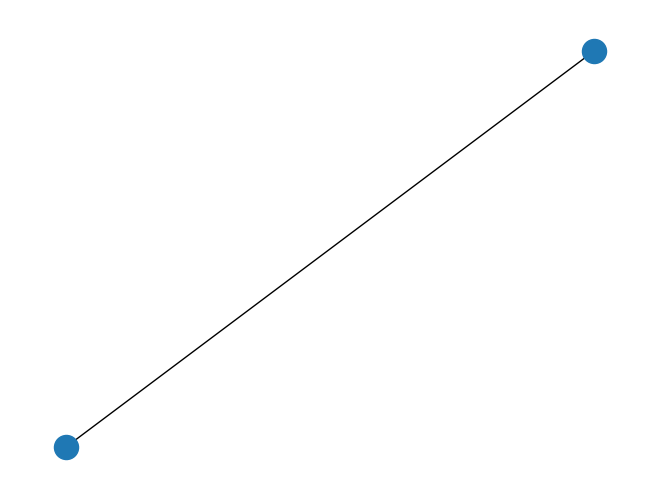

In [57]:
g.add_edge(0,1)
nx.draw(g)

**a)** Haz la imagen de una red de 5,000 nodos (utilizando el programa yEd o cualquier otro que te guste) utilizando $\alpha = 0.5$ Haz la gráfica de la $P(k)$ para una red con 100,000. nodos o más (los que aguante tu computadora).

In [58]:
a = 0.5
c = 1
for i in range(1,N):
        g.add_node(i)
        for j in range(1,i):
            if C*g.degree[j-1]**a < C*g.degree[j]**a:
                g.add_edge(i,j)
            elif C*g.degree[j-1]**a > C*g.degree[j]**a:
                g.add_edge(j-1,i)
            else:
                continue  

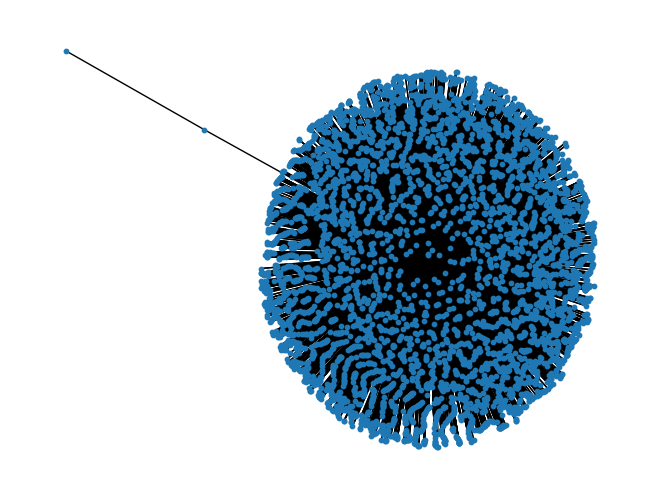

In [63]:
g.add_edge(0,2)
nx.draw(g,node_size=10)

In [67]:
def ba_graph(N,g,a,C):
    for i in range(1,N):
        g.add_node(i)
        for j in range(1,i):
            if C*g.degree[j-1]**a < C*g.degree[j]**a:
                g.add_edge(i,j)
            elif C*g.degree[j-1]**a > C*g.degree[j]**a:
                g.add_edge(j-1,i)
            else:
                continue  
    fig,ax = plt.subplots(figsize=(9, 7))
    pos = nx.kamada_kawai_layout(g)
    nx.draw(g,node_size=10)
    nx.draw_networkx_edges(g, pos=pos,edgelist=g.edges, edge_color='gray',ax=ax)  

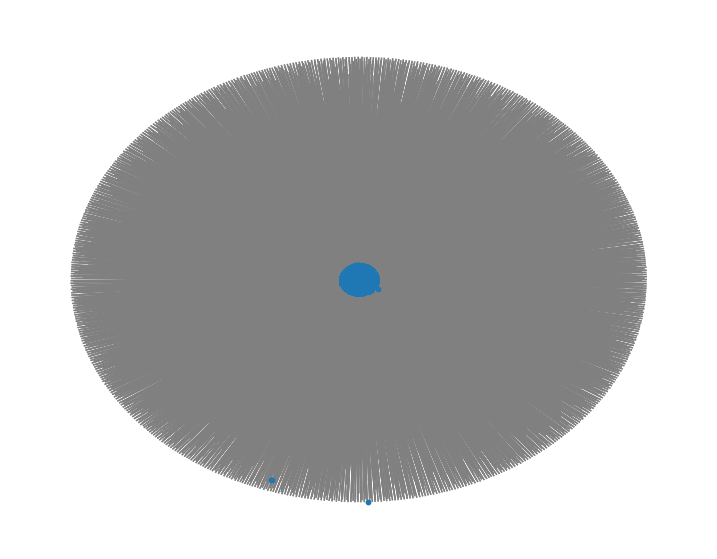

In [68]:
g = nx.Graph()
g.add_edge(0,1)
g.add_edge(2,3)
ba_graph(N,g,0.5,C)

**b)** Lo mismo que en el inciso anterior, pero ahora con $\alpha = 1.5$.


In [ ]:
ba_graph(N,g,1.5,C)

# Parte 2
En clase vimos el modelo SIS (Susceptible-Infectado-Susceptible) que más o menos describe la propagación de la epidemia de COVID-19. En este modelo sencillo una persona infectada se puede recuperar y volverse a infectar con la misma probabilidad que cualquier otra persona (como si nunca antes se hubiera infectado).

Sin embargo, sabemos que las personas que se enfermaron de COVID-19 y se recuperaron, si bien eran susceptibles de volverse a contagiar, generaban cierta inmunidad y la probabilidad de volverse a enfermar era menor que para las personas que nunca antes se habían contagiado.

Por lo tanto en este proyecto tendrás que modificar el modelo SIS para tomar en cuenta la inmunidad adquirida por las personas que ya padecieron la enfermedad y se recuperaron.

El modelo queda descrito por la siguiente figura:

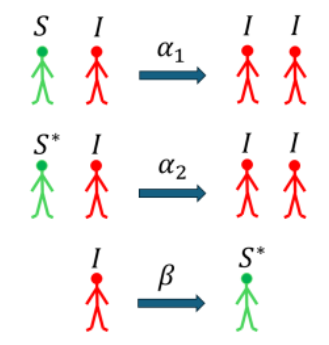

Denotamos como $S$ a la fracción de personas susceptibles que aún no se han enfermado,
como $S^{*}$ a la fracción de personas que se enfermaron, se recuperaron y son susceptibles de
volverse a enfermar. $I$ es la fracción de personas enfermas (o infectadas) y $V$ la fracción de
personas vacunadas. Claramente se debe satisfacer la ecuación

$$S+S^{*}+I+V=1$$

Las reglas de interacción para este modelo SIS modificado son como se ilustran en la figura de este proyecto y quedan descritas de la siguiente manera:

• La probabilidad de que una persona S se infecte al estar en contacto con una
persona $I$ es $\alpha_1 = 0.3$.

• La probabilidad de que una persona infectada $I$ se recupere convirtiéndose en una persona $S^{*}$ es $\beta = 0.1$ (todas las personas que se infectan, al recuperarse, se convierten en personas $S^{*}$).

• La probabilidad de que una persona $S*$ se vuelva a infectar al estar en contacto con una persona $I$ es $\alpha_2 = \frac{\alpha_1}{3}=0.1$ (si ya te enfermaste, la probabilidad de volverte a contagiar es tres veces menor que la probabilidad original).

Para redes de Edös-Rényi y redes de Barabási, haz la gráfica de la prevalencia de la infección como función de la fracción V de personas vacunadas para los siguientes casos:

• Vacunando aleatoriamente a la población.

• Vacunando a los super-propagadores (los “hubs” de la red).

Recuerda que la prevalencia de la infección es la fracción de personas infectadas en el límite $t → ∞$, el cual puedes calcular promediando una vez que la serie temporal $I(t)$ ha alcanzado un estado estacionario, como se ilustra en la siguiente figura:

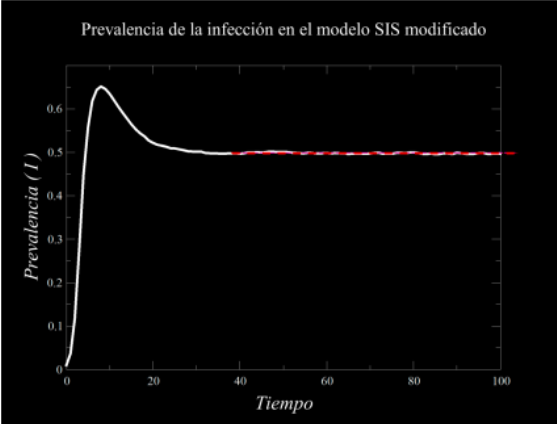

Serie temporal que muestra la fracción de personas infectadas $I(t)$ como función del tiempo para el modelo SIS modificado. La línea roja discontinua es el promedio después de que la serie temporal ha alcanzado un estado estacionario.

Para cada modelo analizado, ¿cuál es la fracción $V_c$ de personas vacunadas con la cual se alcanza la inmunidad de rebaño?

$\alpha_1=0.3$ : probabilidad de contagio S-->I.

$\beta=0.1$ : probabilidad de recuperación I-->S*

$\alpha_2=0.1$ : probabilidad de contagio menor S*-->I



## Vacunando aleatoriamente a la población

Importamos las librerías:

In [1]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

Inicializamos los parámetros:

In [10]:
time = np.arange(100)
prob = [0,0.1,0.2,0.3,0.4,0.5]
a1 = 0.3
a2 = 0.1
b = 0.1
n1=50
n=100
p=0.1

Creamos las funciones necesarias para este problema:

In [6]:
def estado_actual(labels,i):
    return labels[i]

def cambio_estado(labels,i,j,a1,nodes_colors):
    prob = [0,0.1,0.2,0.3,0.4,0.5]
    if estado_actual(labels,i) == 'S':
        if estado_actual(labels,j) =='I':
            rand = np.random.choice(prob,1)
            if rand <= a1:
                labels[i] = 'I'
                nodes_colors[i] ='yellow'
    if estado_actual(labels,i) == 'I':
        if estado_actual(labels,j) =='S':
            rand = np.random.choice(prob,1)
            if rand <= a1:
                labels[j] = 'I'
                nodes_colors[j] ='yellow'
    if estado_actual(labels,i) == 'S*':
        if estado_actual(labels,j) =='I':
            rand = np.random.choice([1,2],1)
            if rand == 1:
                labels[i] = 'I'
                nodes_colors[i] ='yellow'
            elif rand ==2:
                labels[j] = 'S*'
                nodes_colors[j] ='green'
    if estado_actual(labels,i) == 'I':
        if estado_actual(labels,j) =='S*':
            rand = np.random.choice([1,2],1)
            if rand == 1:
                labels[j] = 'I' 
                nodes_colors[j] ='yellow'
            elif rand ==2:
                labels[i] = 'S*'
                nodes_colors[i] ='green'
    if estado_actual(labels,i) == 'V' or estado_actual(labels,j) =='V':
        rand = np.random.choice(prob,1)
        if rand <= a2:
            labels[i] = 'V' 
            labels[j] = 'V'  
            nodes_colors[i] ='blue'
            nodes_colors[j] ='blue'
    return labels
        
def cambio_color(labels,i,nodes_colors):
    if labels[i] == 'S':
        nodes_colors[i] = 'red'
    if labels[i] == 'I':
        nodes_colors[i] = 'yellow'
    if labels[i] == 'S*':
        nodes_colors[i] = 'green'
    if labels[i] == 'V':
        nodes_colors[i] = 'blue'
    return nodes_colors


def evolucion_SIS(n,g,labels,nodes_colors,pos):
    for i in range(n):
        for j in range(n):
            for m in range(g.number_of_edges()):
                if list(g.edges())[m] == (i,j):
                    cambio_estado(labels,i,j,0.1,nodes_colors)
                    cambio_color(labels,i,nodes_colors)
                    cambio_color(labels,j,nodes_colors)
    fig, ax = plt.subplots(figsize=(9, 7))
    nx.draw_networkx_nodes(g, pos=pos, node_color=nodes_colors,ax=ax)
    nx.draw_networkx_labels(g, pos=pos, labels=labels,ax=ax)
    nx.draw_networkx_edges(g, pos=pos, edgelist=g.edges, edge_color='gray', ax=ax)    
    
def num_I(labels,n):
    sum = 0
    for i in range(n):
        if estado_actual(labels,i) == 'I':
            sum += 1
    return sum
    
def num_V(labels,n):   
    sum = 0
    for i in range(n):
        if estado_actual(labels,i) == 'V':
            sum += 1 
    return sum          

### Erdos-Renyi
Vacunación aleatoria.

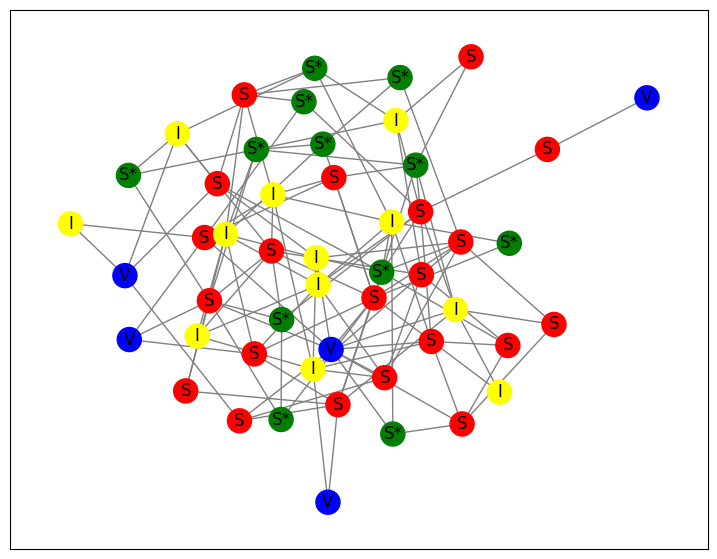

In [24]:
g1 = nx.erdos_renyi_graph(n1,p)
pos = nx.kamada_kawai_layout(g1)

#número de contagiados iniciales
w_S = 0.5
#número de recuperados iniciales
w_Ss = 0.2
#número de vacunados
w_V = 0.1
#número de infectados
w_I = 0.2

lista = [1,2,3,4]
pesos = []
labels = {}
nodes_colors = []
#def crear_estados(g,n):
for i in range (n1):
    rand =  np.random.choice(lista,1,p=[w_S,w_Ss,w_I,w_V])
    # susceptible sin inmunidad
    if rand == lista[0]:
        labels[i]='S'
        nodes_colors.append('red')
    # susceptible con inmunidad
    if rand == lista[1]:
        labels[i]='S*'
        nodes_colors.append('green')
    # infectado
    if rand == lista[2]:
        labels[i]='I'
        nodes_colors.append('yellow')
    if rand == lista[3]:
        labels[i]='V'
        nodes_colors.append('blue')
    #return g

fig, ax = plt.subplots(figsize=(9, 7))
nx.draw_networkx_nodes(g1, pos=pos, node_color=nodes_colors,ax=ax)
nx.draw_networkx_labels(g1, pos=pos, labels=labels,ax=ax)
nx.draw_networkx_edges(g1, pos=pos, edgelist=g1.edges, edge_color='gray', ax=ax)

Observamos una red aleatoria, sin preferencia en los enlaces, parecería favorecer a la hipótesis del buen mezclado.

Se puede observar una red con enlaces preferenciales donde existe un pequeño porcentaje de vacunados, algunas personas recuperadas y una gran parte de la población suceptible o infectada.

C:\Users\Bren\AppData\Local\Temp\ipykernel_7968\3950621647.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(9, 7))


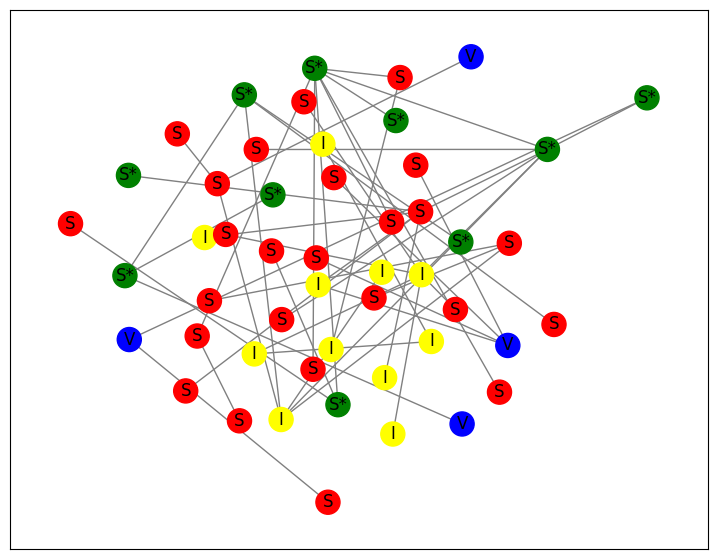

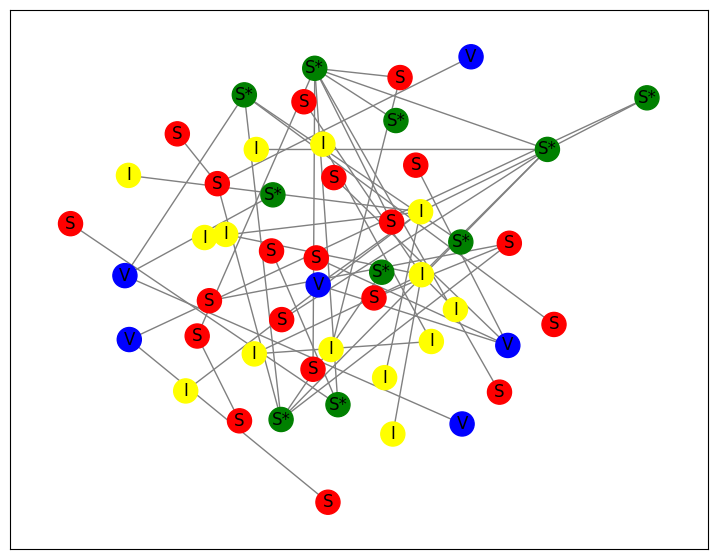

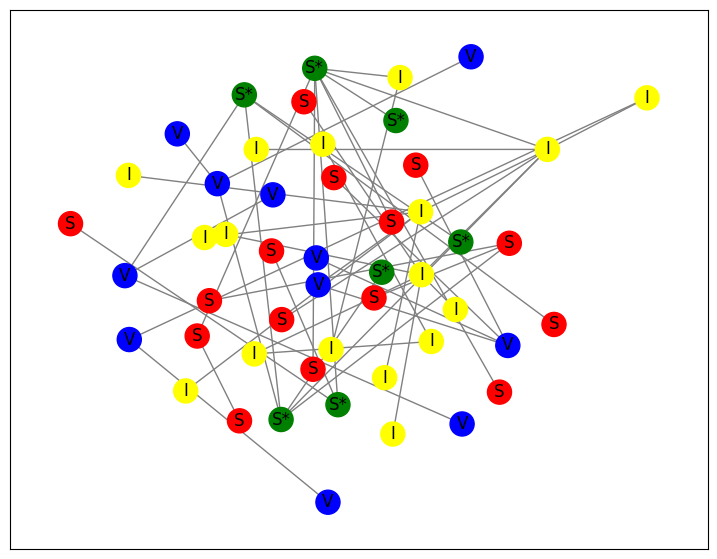

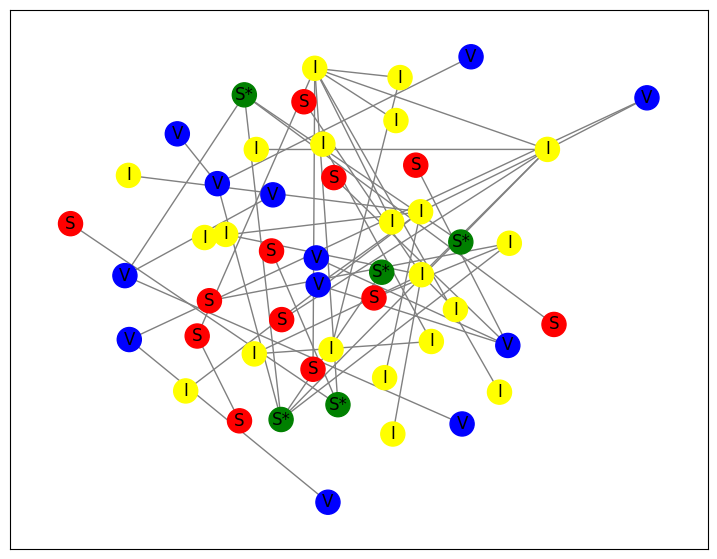

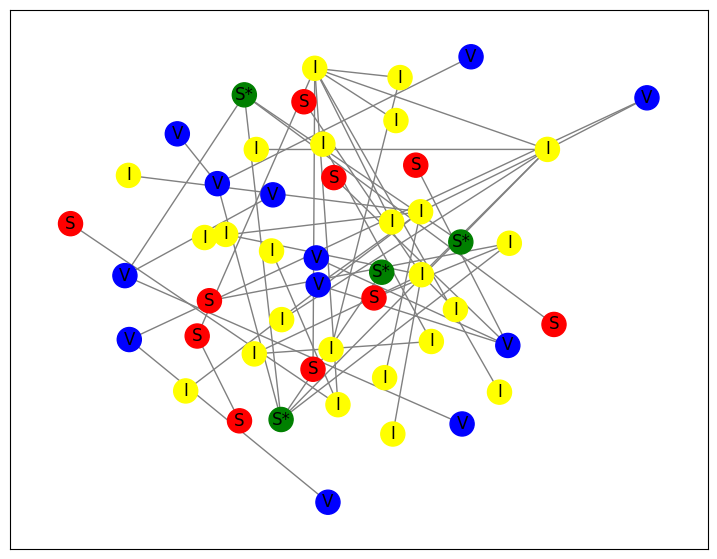

...

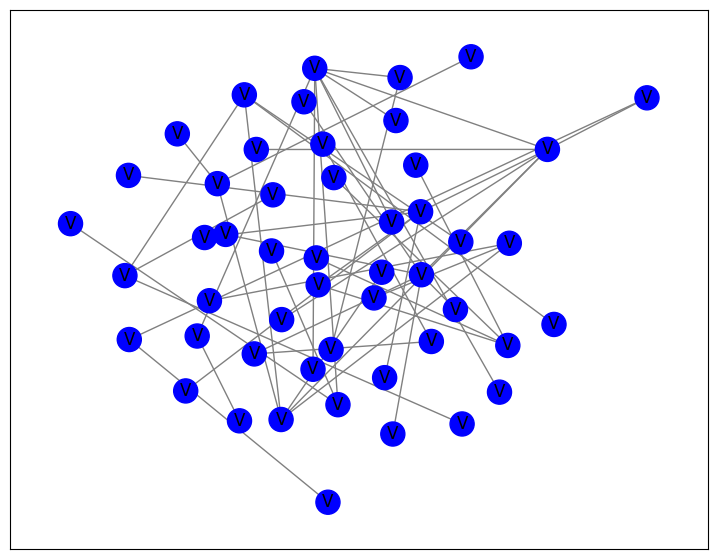

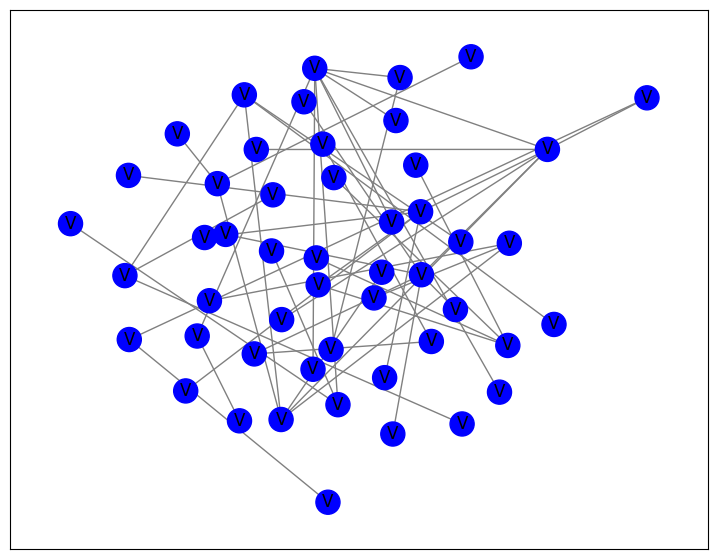

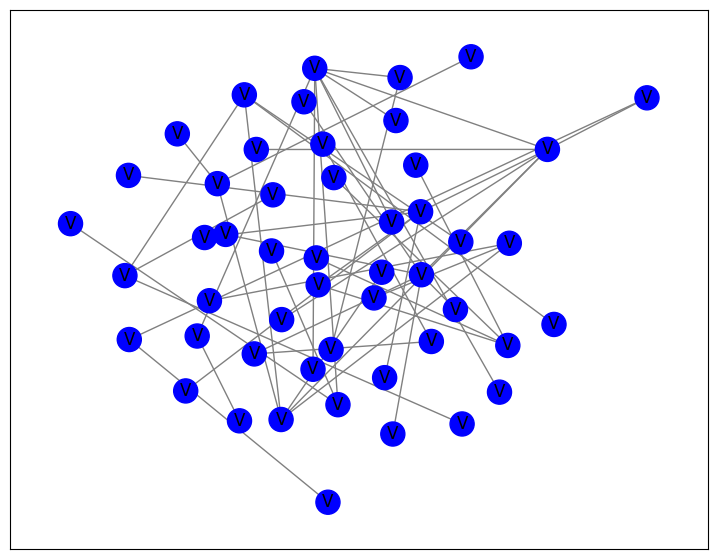

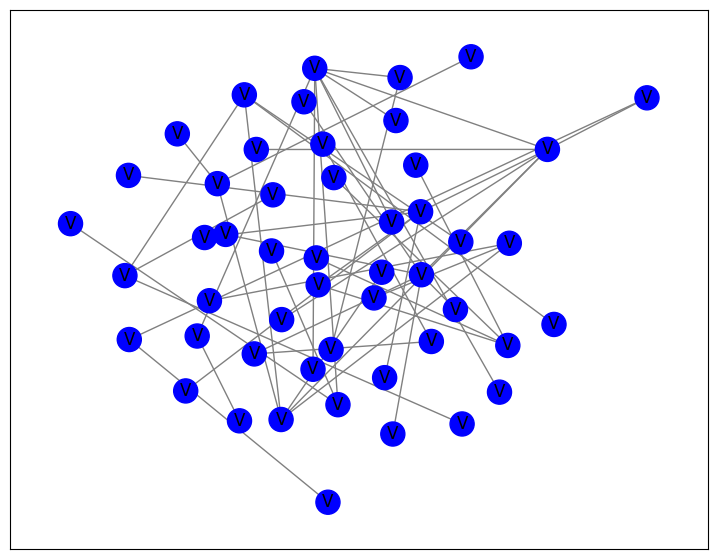

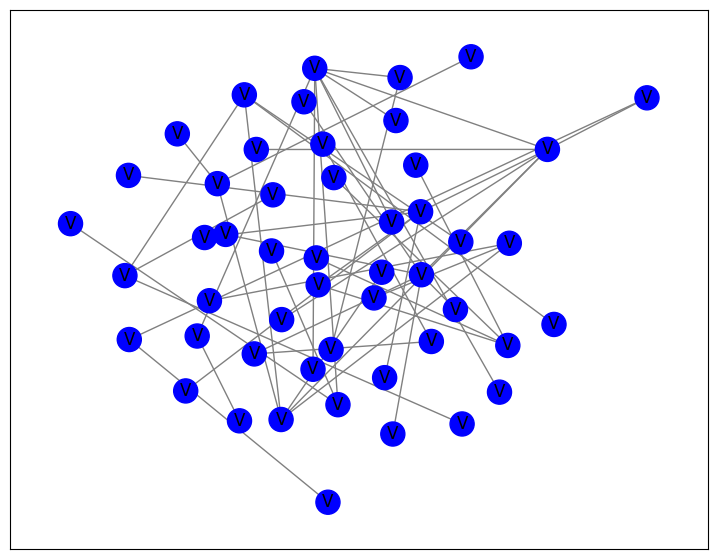

In [32]:
x = []
y = []
for t in range(50):
    evolucion_SIS(n1,g1,labels,nodes_colors,pos)
    x.append(num_I(labels,n1))
    y.append(num_V(labels,n1))

Comparamos el Número de Infectados contra el Número de Vacunados y observamos que el número de infectados disminuye exponencialmente al incrementar el número de vacunados.

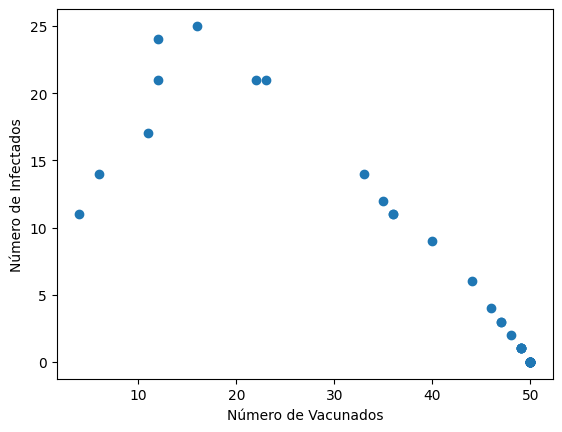

In [33]:
plt.scatter(y,x)
plt.xlabel('Número de Vacunados')
plt.ylabel('Número de Infectados')
plt.show()

Graficamos el número de infectados en el tiempo.

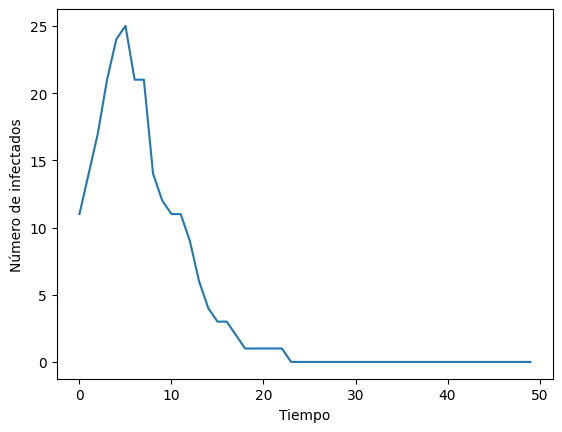

In [35]:
t = np.arange(50)
plt.plot(t,x)
plt.xlabel('Tiempo')
plt.ylabel('Número de infectados')
plt.show()

Podemos observar que aproximadamente en 24 pasos de tiempo, el número de infectados disminuye hasta erradicarse la epidemia. No obstante, esto depende de aquellos nodos vacunados inicialmente que aleatoriamente tengan conexiones a una gran cantidad de nodos, en otro caso, la epidemia podría tardar más en erradicarse.

### Barabasi-Albert
Vacunando a los hubs

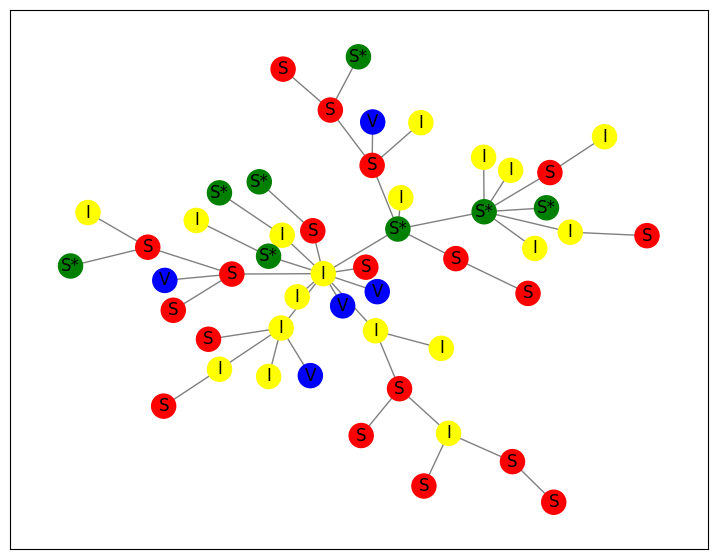

In [36]:
g2 = nx.barabasi_albert_graph(50,1)
pos2 = nx.kamada_kawai_layout(g2)

#número de contagiados iniciales
w_S = 0.5
#número de recuperados iniciales
w_Ss = 0.2
#número de vacunados
w_V = 0.1
#número de infectados
w_I = 0.2

lista = [1,2,3,4]
pesos = []
labels = {}
nodes_colors = []
#def crear_estados(g,n):
for i in range (50):
    rand =  np.random.choice(lista,1,p=[w_S,w_Ss,w_I,w_V])
    # susceptible sin inmunidad
    if rand == lista[0]:
        labels[i]='S'
        nodes_colors.append('red')
    # susceptible con inmunidad
    if rand == lista[1]:
        labels[i]='S*'
        nodes_colors.append('green')
    # infectado
    if rand == lista[2]:
        labels[i]='I'
        nodes_colors.append('yellow')
    if rand == lista[3]:
        labels[i]='V'
        nodes_colors.append('blue')
    #return g

fig, ax = plt.subplots(figsize=(9, 7))
nx.draw_networkx_nodes(g2, pos=pos2, node_color=nodes_colors,ax=ax)
nx.draw_networkx_labels(g2, pos=pos2, labels=labels,ax=ax)
nx.draw_networkx_edges(g2, pos=pos2, edgelist=g2.edges, edge_color='gray', ax=ax)

C:\Users\Bren\AppData\Local\Temp\ipykernel_7968\3950621647.py:65: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(9, 7))


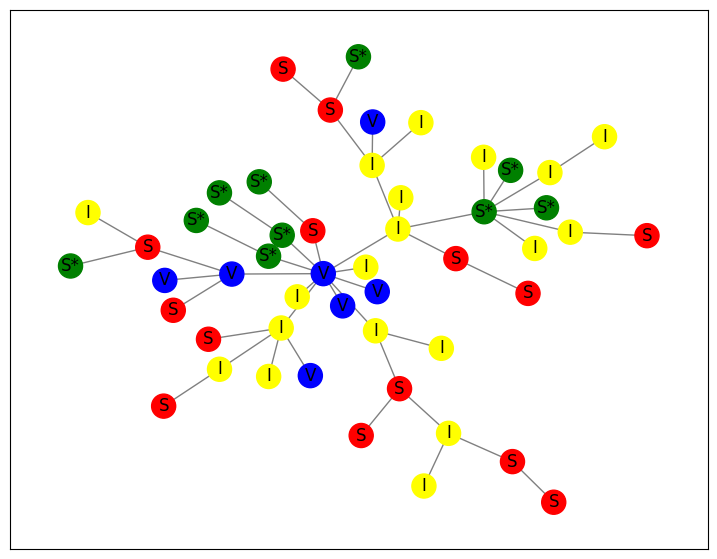

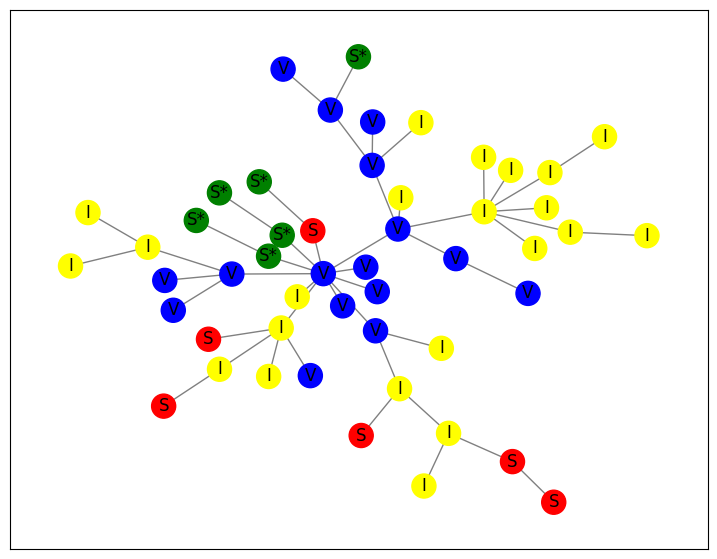

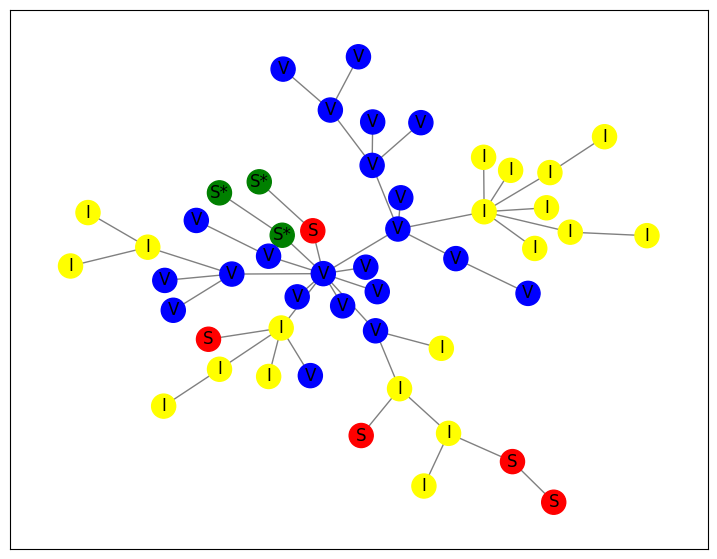

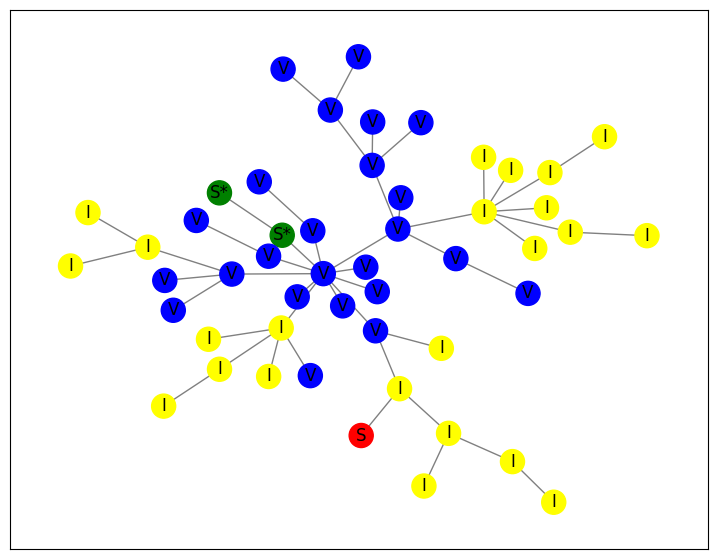

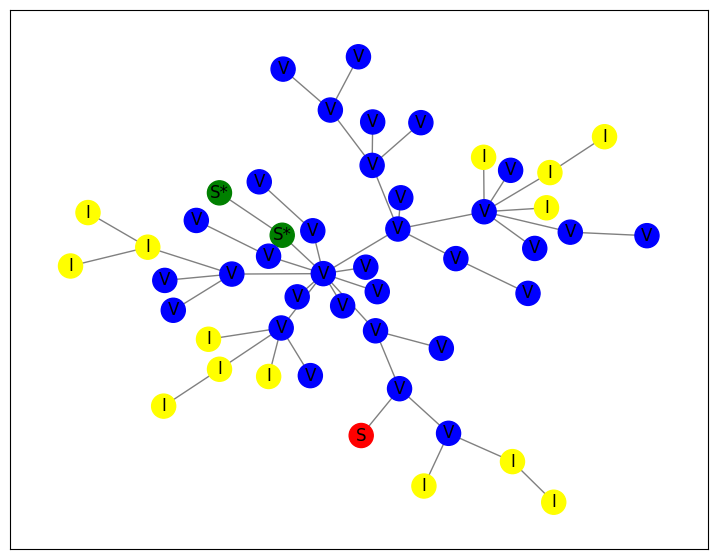

...

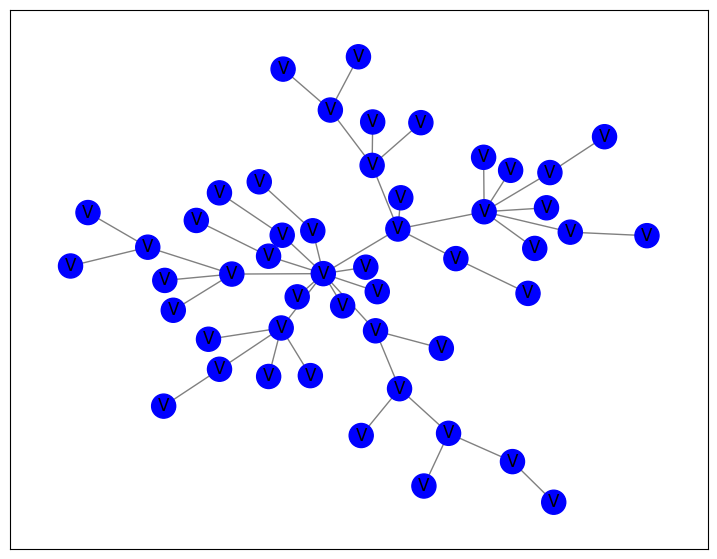

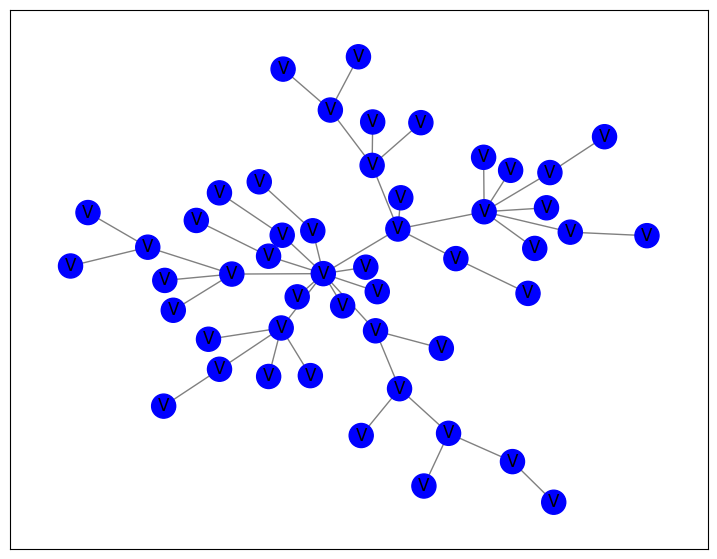

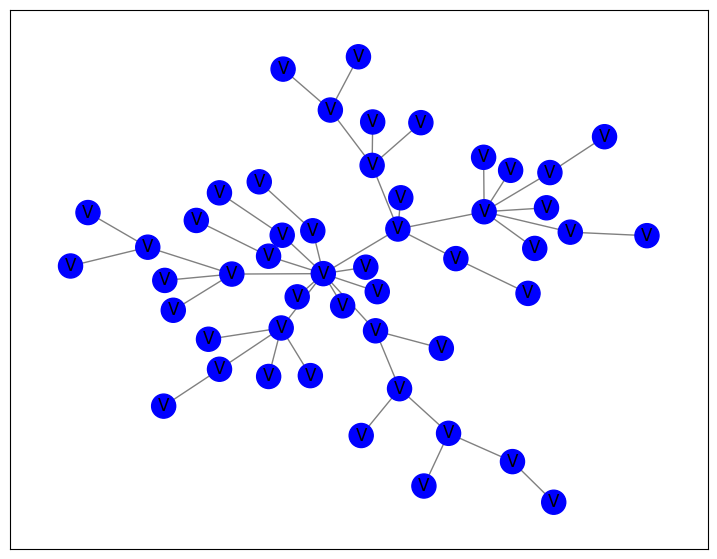

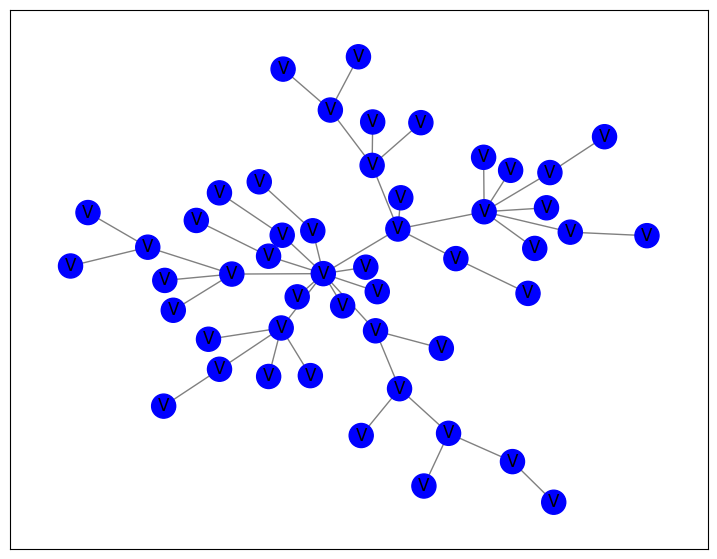

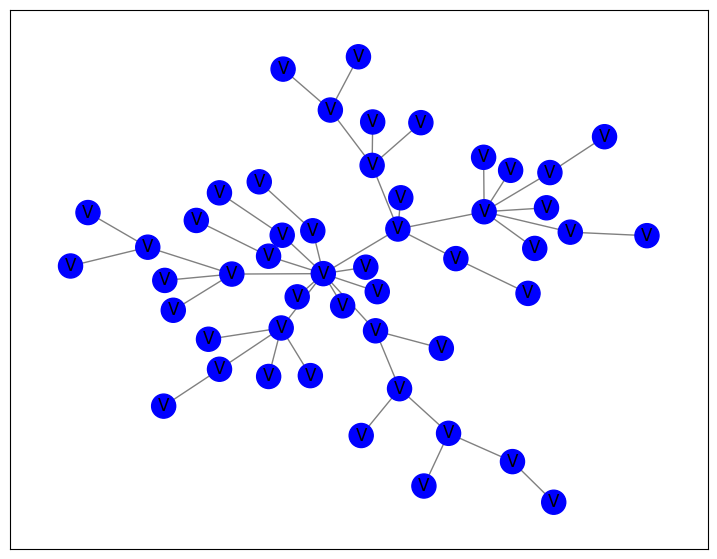

In [37]:
w = []
v = []
for t in range(50):
    evolucion_SIS(50,g2,labels,nodes_colors,pos2)
    w.append(num_I(labels,50))
    v.append(num_V(labels,50))

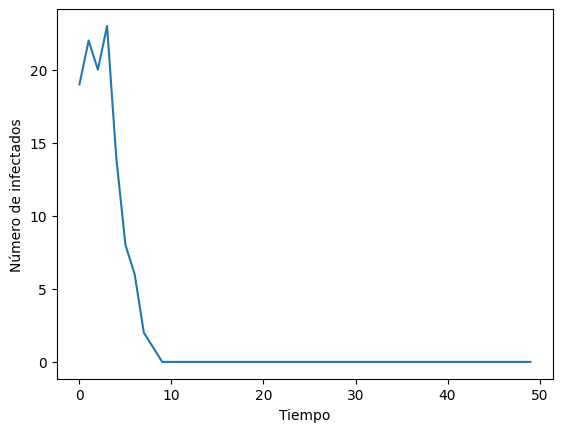

In [38]:
t = np.arange(50)
plt.plot(t,w)
plt.xlabel('Tiempo')
plt.ylabel('Número de infectados')
plt.show()

Observamos que el número de infectados disminuye mucho más rápido (con redes de enlaces preferenciales), al menos dos veces más rápido que en el caso de la hipótesis del buen mezclado (con redes aleatorias). 

Por esta razón, conviene vacunar a los hubs pues la epidemia se podría erradicar al menos dos veces más rápido.